## Like other big cats like Tiger, Lion, and Leopard being poached to be used for #TCM and to make jewelry so are Jaguars.  Jaguars do not receive as much attention as other big cats but Jaguar poaching has trending up.  Corruption is a main driver of this trade, along with other illegal activity. Aside from corruption, the demand of these wildlife products mainly comes from TCM or Traditional Chinese medicine and there has been a pattern of Chinese investment in poorer countries and an increase in poaching.

## This data comes from movebank and contains jaguar location data from 2011 to 2016.  While this data does not overlap with poaching events, this report highlights the importance of tracking jaguars and other endangered animals to improve anti-poaching and anti-trafficking measures.


## https://www.nytimes.com/2020/06/11/science/jaguars-poaching-china.html

In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
import chart_studio.plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import geopandas as gv
init_notebook_mode(connected=True)
%matplotlib inline
sns.set(rc={'figure.figsize':(5,5)})
import pandas as pd
pd.set_option('display.max_columns', None)
df = pd.read_csv('Jaguar_Taiama.csv')
df.head()

C:\Users\willi\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


,event-id,visible,timestamp,location-long,location-lat,sensor-type,individual-taxon-canonical-name,tag-local-identifier,individual-local-identifier,study-name
0,976299855,True,2013-10-15 09:00:29.000,-57.533324,-16.866141,gps,Panthera onca,34770,Picole,Jaguar_Taiama
1,976299856,True,2013-10-15 10:00:17.000,-57.533327,-16.866258,gps,Panthera onca,34770,Picole,Jaguar_Taiama
2,976299857,True,2013-10-15 11:00:19.000,-57.533416,-16.866233,gps,Panthera onca,34770,Picole,Jaguar_Taiama
3,976299858,True,2013-10-15 12:00:08.000,-57.533206,-16.866112,gps,Panthera onca,34770,Picole,Jaguar_Taiama
4,976299859,True,2013-10-15 13:00:15.000,-57.533333,-16.866041,gps,Panthera onca,34770,Picole,Jaguar_Taiama


<AxesSubplot:ylabel='Density'>

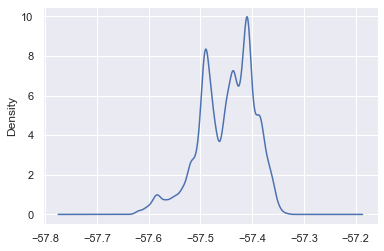

In [2]:
df['location-long'].plot(kind='kde')

<AxesSubplot:ylabel='Density'>

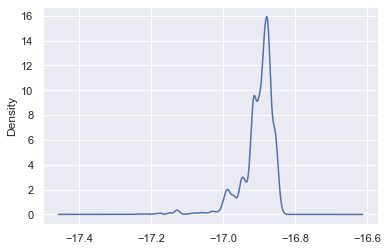

In [3]:
df['location-lat'].plot(kind='kde')

In [4]:
df['timestamp'].describe()

count                       42909
unique                      41557
top       2014-12-11 22:00:30.000
freq                            4
Name: timestamp, dtype: object

In [5]:
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [6]:
df['year'] = df.timestamp.dt.year

In [7]:
df['month'] = df.timestamp.dt.month

In [8]:
df['day'] = df.timestamp.dt.day

In [9]:
df['hour'] = df.timestamp.dt.hour

In [10]:
movement = df[['timestamp', 'location-long','location-lat','year','month','day', 'hour','individual-local-identifier']]

In [11]:
movement.describe()

,location-long,location-lat,year,month,day,hour
count,42909.000000,42909.000000,42909.000000,42909.000000,42909.000000,42909.000000
mean,-57.449289,-16.903190,2014.649118,6.283810,15.530541,11.020672
std,0.052991,0.046608,0.698070,3.961652,8.651222,6.704351
min,-57.627838,-17.246392,2011.000000,1.000000,1.000000,0.000000
25%,-57.488860,-16.916751,2014.000000,3.000000,8.000000,5.000000
50%,-57.439988,-16.891441,2015.000000,5.000000,15.000000,11.000000
75%,-57.408691,-16.875231,2015.000000,10.000000,23.000000,16.000000
max,-57.333626,-16.824454,2016.000000,12.000000,31.000000,23.000000


## This study follows 13 jaguars over 5 years in Brazil.  The sightings for each big cat are different and the most noticeable differences in the number of sightings come from the top 3: Picole, Fera, and Anderson.  There could be many reasons for the differences between the numbers like deforestation or death from natural causes but it would be useful to analyze data like this and what is currently happening in that area with the corruption levels, conflict, food insecurity, etc.

In [12]:
movement['individual-local-identifier'].unique()

array(['Picole', 'Alice', 'Dale', 'Caiman', 'Linda', 'Daryl', 'Fera',
       'Anderson', 'Wendy', 'Milagre', 'Selema', 'Fiao', 'Marrua'],
      dtype=object)

In [13]:
movement['individual-local-identifier'].value_counts()

Picole      10987
Fera         8346
Anderson     5038
Dale         4707
Milagre      3337
Selema       2819
Alice        2682
Caiman       2316
Wendy        1295
Linda         614
Daryl         570
Marrua        109
Fiao           89
Name: individual-local-identifier, dtype: int64

In [14]:
Picole = movement[movement['individual-local-identifier'] == 'Picole']
Fera = movement[movement['individual-local-identifier'] == 'Fera']
Anderson = movement[movement['individual-local-identifier'] == 'Anderson']
Dale = movement[movement['individual-local-identifier'] == 'Dale']
Milagre = movement[movement['individual-local-identifier'] == 'Milagre']
Selema = movement[movement['individual-local-identifier'] == 'Selema']
Alice = movement[movement['individual-local-identifier'] == 'Alice']
Caiman = movement[movement['individual-local-identifier'] == 'Caiman']
Wendy = movement[movement['individual-local-identifier'] == 'Wendy']
Linda = movement[movement['individual-local-identifier'] == 'Linda']
Marrua = movement[movement['individual-local-identifier'] == 'Marrua']
Fiao = movement[movement['individual-local-identifier'] == 'Fiao']
Daryl = movement[movement['individual-local-identifier'] == 'Daryl']


## It looks like the territory for each jaguar overlap at some point(finish analyzing in word document)

No handles with labels found to put in legend.


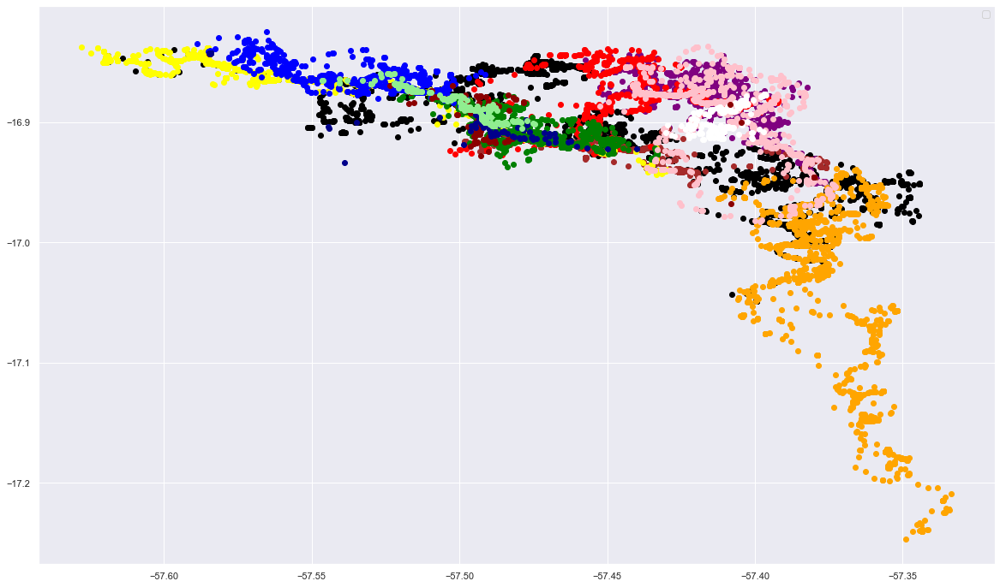

In [61]:
plt.figure(figsize=(20,12))
plt.scatter(Picole['location-long'], Picole['location-lat'],c='black')
plt.scatter(Fera['location-long'], Fera['location-lat'], c='purple')
plt.scatter(Anderson['location-long'], Anderson['location-lat'],c='brown')
plt.scatter(Dale['location-long'], Dale['location-lat'],c='red')
plt.scatter(Milagre['location-long'], Milagre['location-lat'],c='yellow')
plt.scatter(Selema['location-long'], Selema['location-lat'],c='green')
plt.scatter(Alice['location-long'], Alice['location-lat'],c='orange')
plt.scatter(Caiman['location-long'], Caiman['location-lat'],c='pink')
plt.scatter(Wendy['location-long'], Wendy['location-lat'],c='blue')
plt.scatter(Linda['location-long'], Linda['location-lat'],c='white')
plt.scatter(Marrua['location-long'], Marrua['location-lat'],c='darkred')
plt.scatter(Fiao['location-long'], Fiao['location-lat'],c='darkblue')
plt.scatter(Daryl['location-long'], Daryl['location-lat'],c='lightgreen')
plt.legend()

In [63]:
fig = px.scatter_3d(movement, x='year', y='hour', z='month',
                   color='individual-local-identifier')
fig.show()

In [18]:
fig = px.scatter_3d(movement, x='location-long', y='location-lat', z='individual-local-identifier',
                   color='month')
fig.show()

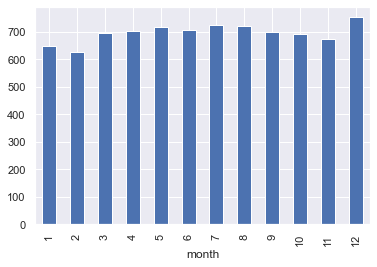

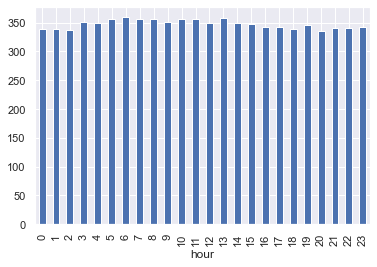

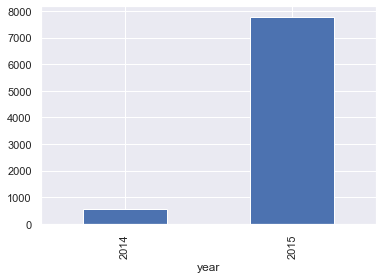

In [19]:
Fera.groupby('month')['month'].count().plot.bar()
plt.show()
Fera.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Fera.groupby('year')['year'].count().plot(kind='bar')
plt.show()

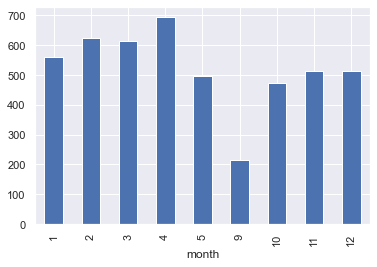

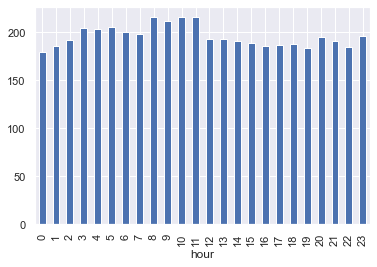

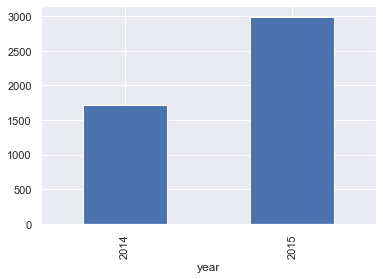

In [20]:
Dale.groupby('month')['month'].count().plot.bar()
plt.show()
Dale.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Dale.groupby('year')['year'].count().plot(kind='bar')
plt.show()

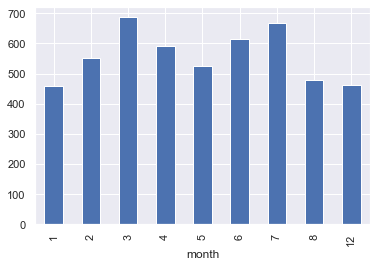

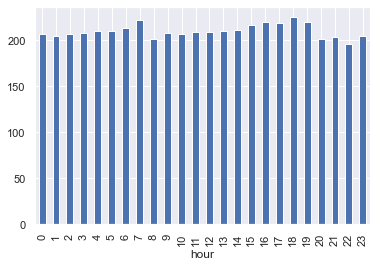

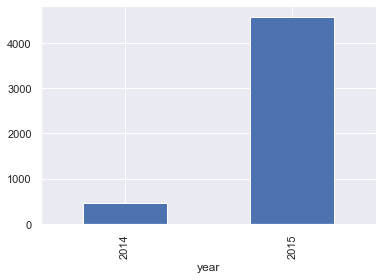

In [21]:
Anderson.groupby('month')['month'].count().plot.bar()
plt.show()
Anderson.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Anderson.groupby('year')['year'].count().plot(kind='bar')
plt.show()

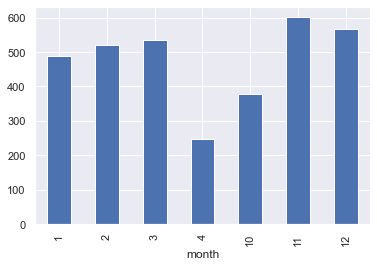

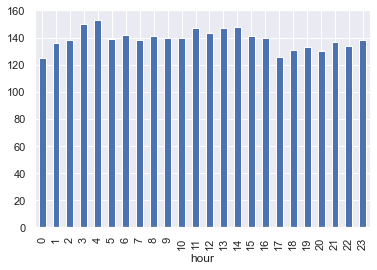

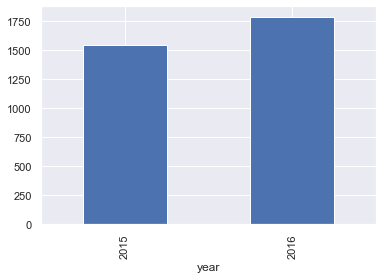

In [22]:
Milagre.groupby('month')['month'].count().plot.bar()
plt.show()
Milagre.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Milagre.groupby('year')['year'].count().plot(kind='bar')
plt.show()

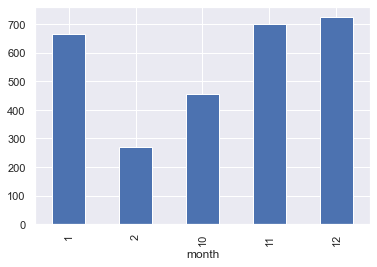

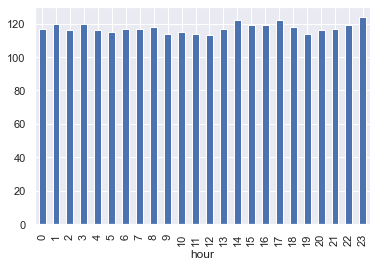

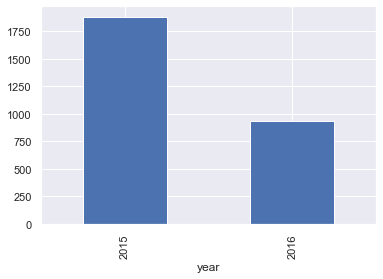

In [23]:
Selema.groupby('month')['month'].count().plot.bar()
plt.show()
Selema.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Selema.groupby('year')['year'].count().plot(kind='bar')
plt.show()

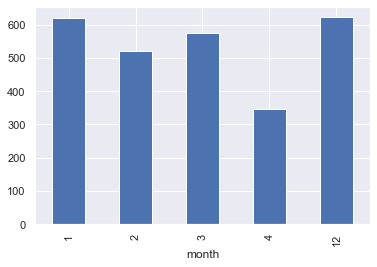

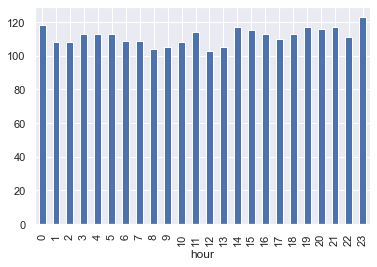

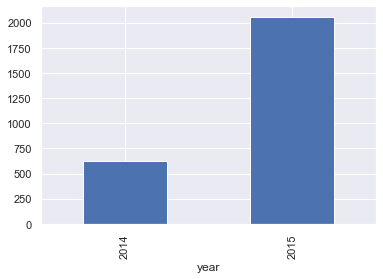

In [24]:
Alice.groupby('month')['month'].count().plot.bar()
plt.show()
Alice.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Alice.groupby('year')['year'].count().plot(kind='bar')
plt.show()

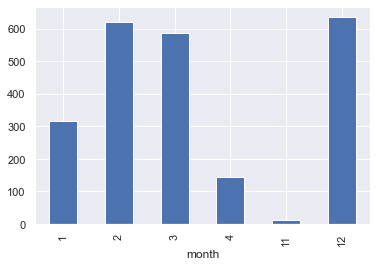

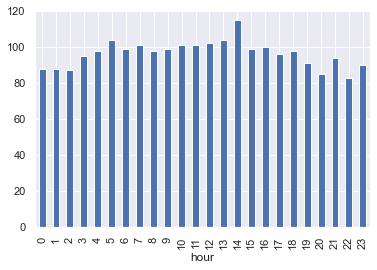

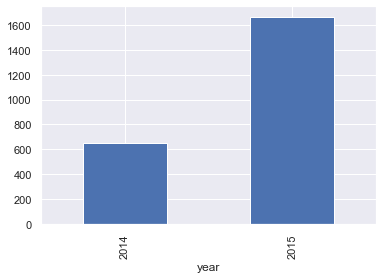

In [25]:
Caiman.groupby('month')['month'].count().plot.bar()
plt.show()
Caiman.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Caiman.groupby('year')['year'].count().plot(kind='bar')
plt.show()

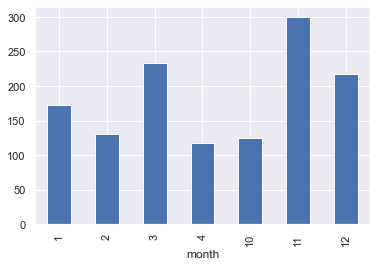

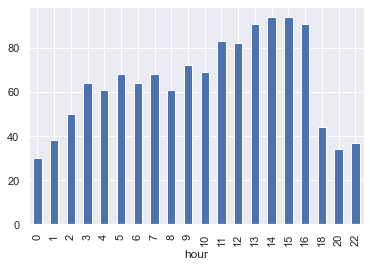

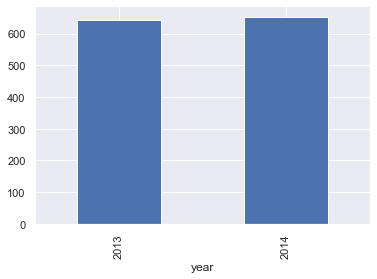

In [26]:
Wendy.groupby('month')['month'].count().plot.bar()
plt.show()
Wendy.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Wendy.groupby('year')['year'].count().plot(kind='bar')
plt.show()

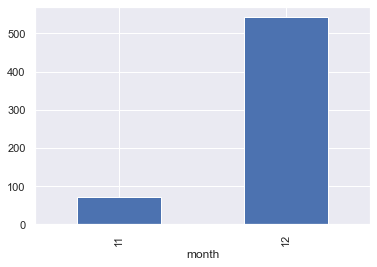

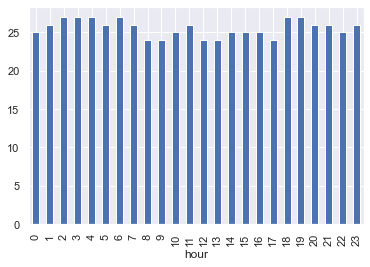

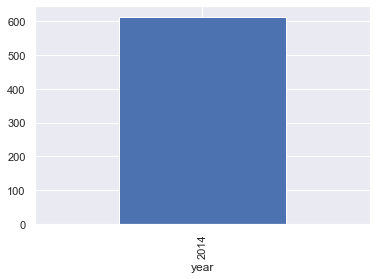

In [27]:
Linda.groupby('month')['month'].count().plot.bar()
plt.show()
Linda.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Linda.groupby('year')['year'].count().plot(kind='bar')
plt.show()

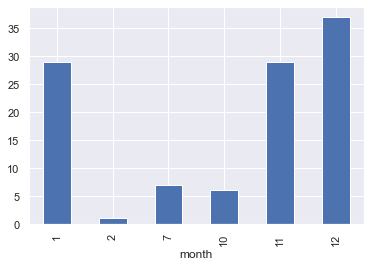

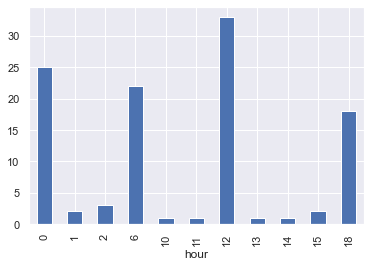

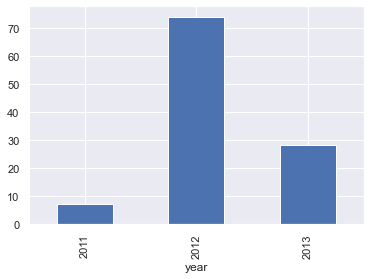

In [28]:
Marrua.groupby('month')['month'].count().plot.bar()
plt.show()
Marrua.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Marrua.groupby('year')['year'].count().plot(kind='bar')
plt.show()

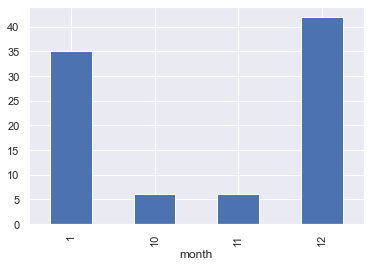

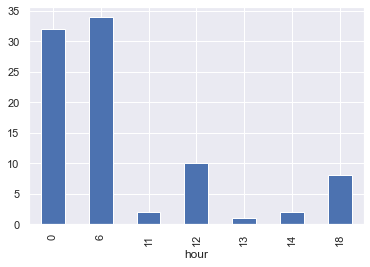

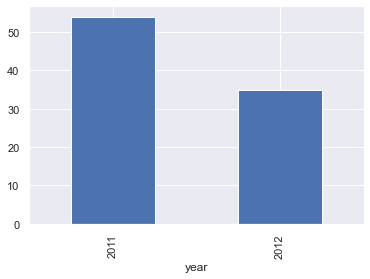

In [29]:
Fiao.groupby('month')['month'].count().plot.bar()
plt.show()
Fiao.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Fiao.groupby('year')['year'].count().plot(kind='bar')
plt.show()

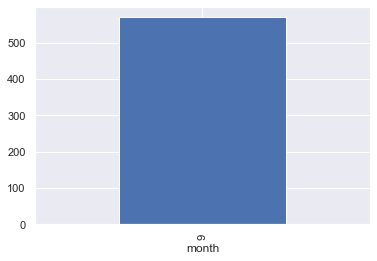

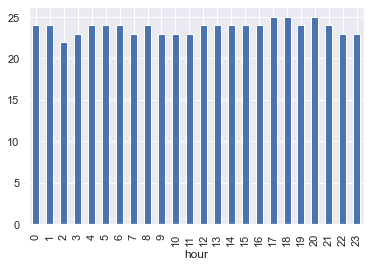

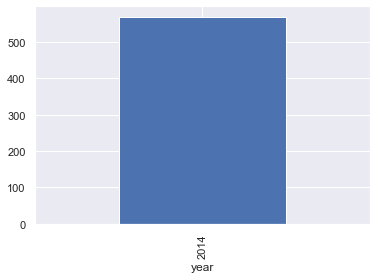

In [30]:
Daryl.groupby('month')['month'].count().plot.bar()
plt.show()
Daryl.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Daryl.groupby('year')['year'].count().plot(kind='bar')
plt.show()

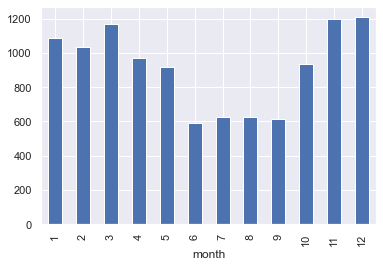

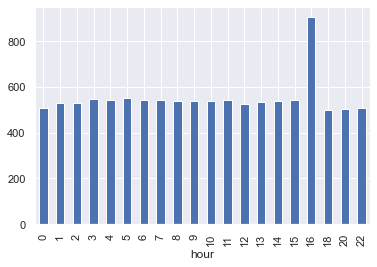

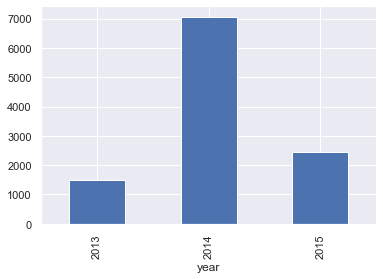

In [31]:
Picole.groupby('month')['month'].count().plot.bar()
plt.show()
Picole.groupby('hour')['hour'].count().plot(kind='bar')
plt.show()
Picole.groupby('year')['year'].count().plot(kind='bar')
plt.show()

In [32]:
fig = go.Figure(data=go.Scattergeo(
        lon = df['location-long'],
        lat = df['location-lat'],
        text= df['timestamp'],
        mode = 'markers',
        marker_color = 'red',
        ))
fig.update_layout(
        geo_scope='south america',
    )